# EDA of ImageWoof dataset

## Import of libraries and loading the dataset

In [1]:
import pandas as pd
import numpy as np
import cv2 as cv
from dask import bag, diagnostics
import os
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
from scipy.stats import chisquare

%matplotlib inline
sns.set_theme()
rcParams['figure.figsize'] = 20, 12

In [2]:
path_to_imgs = '../imagewoof2/'
path_to_csv = '../imagewoof2/noisy_imagewoof.csv'

In [3]:
dataset_info_df = pd.read_csv(path_to_csv).set_index(['path'])
dataset_info_df.head(10)

,noisy_labels_0,noisy_labels_1,noisy_labels_5,noisy_labels_25,noisy_labels_50,is_valid
path,,,,,,
train/n02115641/n02115641_3995.JPEG,n02115641,n02115641,n02115641,n02115641,n02115641,False
train/n02115641/n02115641_843.JPEG,n02115641,n02115641,n02105641,n02115641,n02088364,False
train/n02115641/n02115641_2953.JPEG,n02115641,n02115641,n02115641,n02111889,n02099601,False
train/n02115641/n02115641_6458.JPEG,n02115641,n02115641,n02115641,n02093754,n02115641,False
train/n02115641/n02115641_19414.JPEG,n02115641,n02115641,n02115641,n02115641,n02088364,False
train/n02115641/n02115641_40194.JPEG,n02115641,n02115641,n02115641,n02115641,n02086240,False
train/n02115641/n02115641_3707.JPEG,n02115641,n02115641,n02115641,n02115641,n02115641,False
train/n02115641/n02115641_22553.JPEG,n02115641,n02115641,n02115641,n02115641,n02093754,False
train/n02115641/n02115641_11407.JPEG,n02115641,n02115641,n02115641,n02115641,n02115641,False


In [4]:
len(dataset_info_df)

12954

In [5]:
def get_bluriness(image):
    """
    Calculate blur extent of an image.
    If variance of 2nd derivative is too high, it means that the image has
    wide spread of responses (edges, center of objects and etc.) 
    Bluriness also can means contrast of an image
    """
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    gray = gray/np.max(gray)
    return cv.Laplacian(gray, cv.CV_64F).var()

In [6]:
def get_img_dimensions(image):
    """
    Return image shape with it's area
    """
    height, width, channels = image.shape
    area = height * width
    return height, width, channels, area

In [7]:
def get_brightness(image):
    """
    Return image brightness
    it's mean and variance of luminance dimension in LAB space 
    """
    L, _, _ = cv.split(cv.cvtColor(image, cv.COLOR_BGR2LAB))
    L = L/np.max(L)
    return np.mean(L), np.var(L)

In [8]:
def get_img_data(image_path):
    """
    Collect all data to dict
    """
    img_path = os.path.join(path_to_imgs, image_path)
    image = cv.imread(img_path)
    
    data = {}
    h, w, ch, area = get_img_dimensions(image)
    
    data['path'] = image_path

    data['height'] = h
    data['width'] = w
    data['ch'] = ch
    data['area'] = area

    bluriness = get_bluriness(image)
    m_brightness, var_brightness  = get_brightness(image)

    data['bluriness'] = bluriness

    data['m_brightness'] = m_brightness
    data['var_brigtness'] = var_brightness
    
    return data

In [9]:
def plot_img(image_path):
    img_path = os.path.join(path_to_imgs, image_path)
    img = cv.imread(img_path)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    plt.figure(figsize=(5, 5))
    plt.title(image_path)
    plt.axis('off')
    plt.imshow(img)

In [10]:
# parallel reading of image parametrs 
img_bag = bag.from_sequence(dataset_info_df.index).map(get_img_data)
with diagnostics.ProgressBar():
    img_data = img_bag.compute()

[########################################] | 100% Completed |  2min  1.0s


In [11]:
img_info_df = pd.DataFrame(img_data).set_index(['path'])
full_d_info = pd.merge(dataset_info_df, img_info_df, left_index=True, right_index=True)

## Find properties of classes

In [12]:
full_d_info

,noisy_labels_0,noisy_labels_1,noisy_labels_5,noisy_labels_25,noisy_labels_50,is_valid,height,width,ch,area,bluriness,m_brightness,var_brigtness
path,,,,,,,,,,,,,
train/n02115641/n02115641_3995.JPEG,n02115641,n02115641,n02115641,n02115641,n02115641,False,375,500,3,187500,0.087221,0.513493,0.040670
train/n02115641/n02115641_843.JPEG,n02115641,n02115641,n02105641,n02115641,n02088364,False,375,500,3,187500,0.031876,0.519655,0.044988
train/n02115641/n02115641_2953.JPEG,n02115641,n02115641,n02115641,n02111889,n02099601,False,284,360,3,102240,0.007166,0.544613,0.047951
train/n02115641/n02115641_6458.JPEG,n02115641,n02115641,n02115641,n02093754,n02115641,False,90,120,3,10800,0.039443,0.539701,0.055540
train/n02115641/n02115641_19414.JPEG,n02115641,n02115641,n02115641,n02115641,n02088364,False,375,500,3,187500,0.007072,0.549675,0.010206
...,...,...,...,...,...,...,...,...,...,...,...,...,...
val/n02089973/n02089973_9351.JPEG,n02089973,n02089973,n02089973,n02089973,n02089973,True,505,640,3,323200,0.016701,0.520646,0.060415
val/n02089973/n02089973_1241.JPEG,n02089973,n02089973,n02089973,n02089973,n02089973,True,64,58,3,3712,0.071632,0.436584,0.069723
val/n02089973/n02089973_4702.JPEG,n02089973,n02089973,n02089973,n02089973,n02089973,True,400,298,3,119200,0.020613,0.477653,0.051657


In [13]:
full_d_info.describe()

,height,width,ch,area,bluriness,m_brightness,var_brigtness
count,12954.000000,12954.000000,12954.0,1.295400e+04,12954.000000,12954.000000,12954.000000
mean,397.140652,470.273352,3.0,2.126696e+05,0.037221,0.492160,0.054359
std,165.896724,198.580817,0.0,3.794577e+05,0.050424,0.114366,0.023693
min,33.000000,50.000000,3.0,1.650000e+03,0.000090,0.045884,0.001177
25%,333.000000,377.000000,3.0,1.665000e+05,0.008634,0.418872,0.037293
50%,375.000000,500.000000,3.0,1.875000e+05,0.019758,0.491538,0.051671
75%,461.000000,500.000000,3.0,1.875000e+05,0.044370,0.562650,0.068074
max,3456.000000,4608.000000,3.0,1.592525e+07,0.883595,0.946925,0.192861


## Distribution of classes

In [14]:
full_d_info['is_valid'].value_counts()

False    9025
True     3929
Name: is_valid, dtype: int64

In [15]:
classes_count = full_d_info['noisy_labels_0'].value_counts().sort_index()
classes_count

n02086240    1350
n02087394    1350
n02088364    1350
n02089973     804
n02093754    1350
n02096294    1350
n02099601    1350
n02105641    1350
n02111889    1350
n02115641    1350
Name: noisy_labels_0, dtype: int64

In [16]:
def plot_class_distr(x, y, title="Distribution of right classes in whole dataset"):
    plt.figure(figsize=(15, 7))
    sns.barplot(x, y, alpha=0.8)
    plt.title(title)
    plt.ylabel('Number of examples', fontsize=12)
    plt.xlabel('Class', fontsize=12)

d:\Projects\ImageWoofCls\venv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


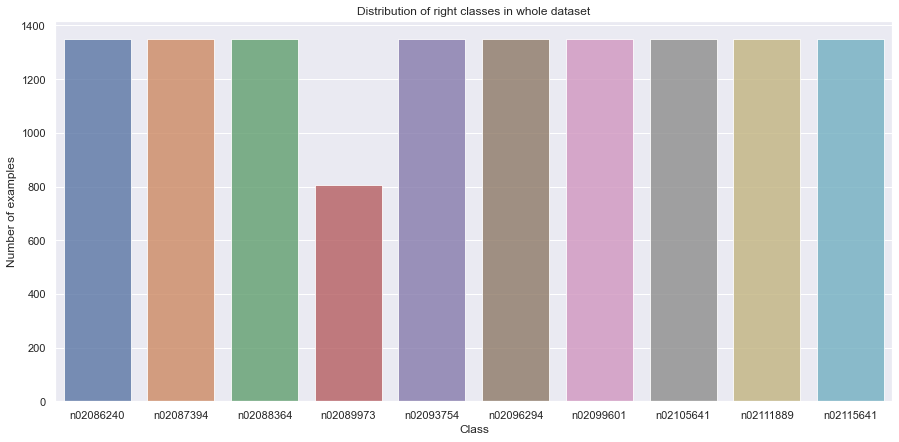

In [17]:
#Let's plot distribution of classes of all dataset
plot_class_distr(classes_count.index, classes_count.values)

d:\Projects\ImageWoofCls\venv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


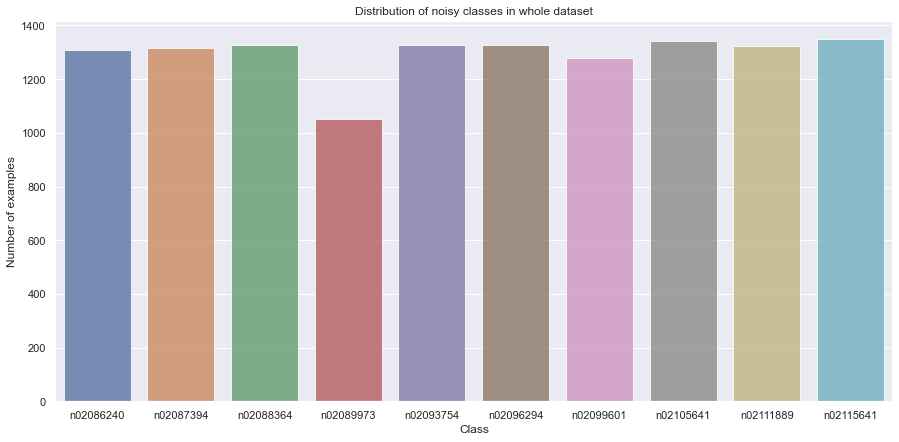

In [18]:
classes_count_noisy = full_d_info['noisy_labels_50'].value_counts().sort_index()
plot_class_distr(classes_count_noisy.index, classes_count_noisy.values, title="Distribution of noisy classes in whole dataset")

We can see, that class distributiom is uniform. But class n020289973 has less number of examples. <br>
Let's check distribution according to it's is_valid column

In [19]:
def plot_train_val_distr(dataset, title='Distribution of right classes in train and valid dataset'):
    plt.figure(figsize=(15, 7))
    plt.title(title)
    sns.barplot(x='label', y='count', data=dataset, hue='is_valid')

In [20]:
def get_count(dataset, col):
    return dataset.groupby([col, 'is_valid']).size().reset_index().rename(columns={0:'count', col:'label'})

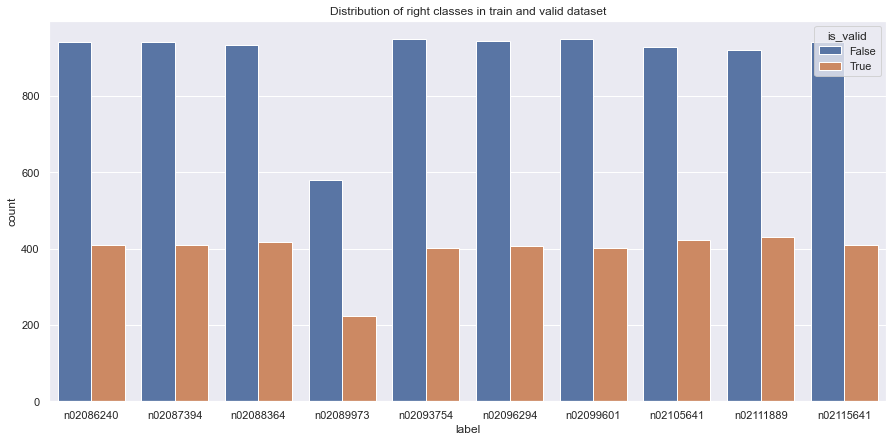

In [21]:
classes_count_valid_train = get_count(full_d_info, 'noisy_labels_0')
plot_train_val_distr(classes_count_valid_train)

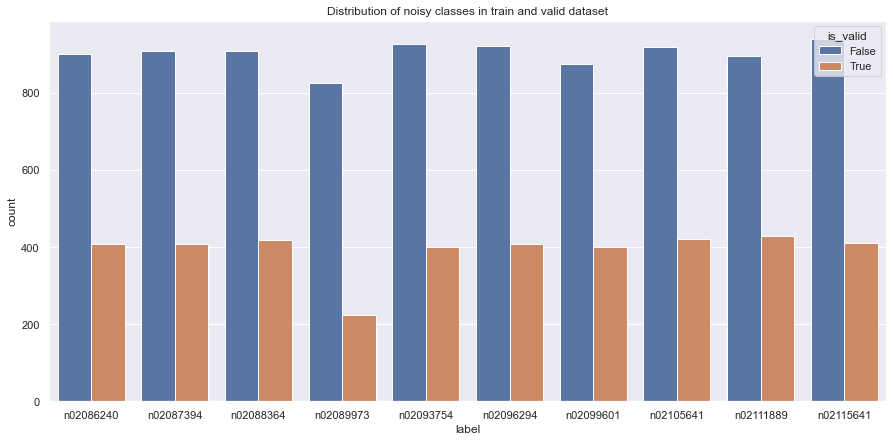

In [22]:
classes_count_valid_train = get_count(full_d_info, 'noisy_labels_50')
plot_train_val_distr(classes_count_valid_train, title='Distribution of noisy classes in train and valid dataset')

Text(0.5, 0.98, 'Distribution of parametrs in whole dataset')

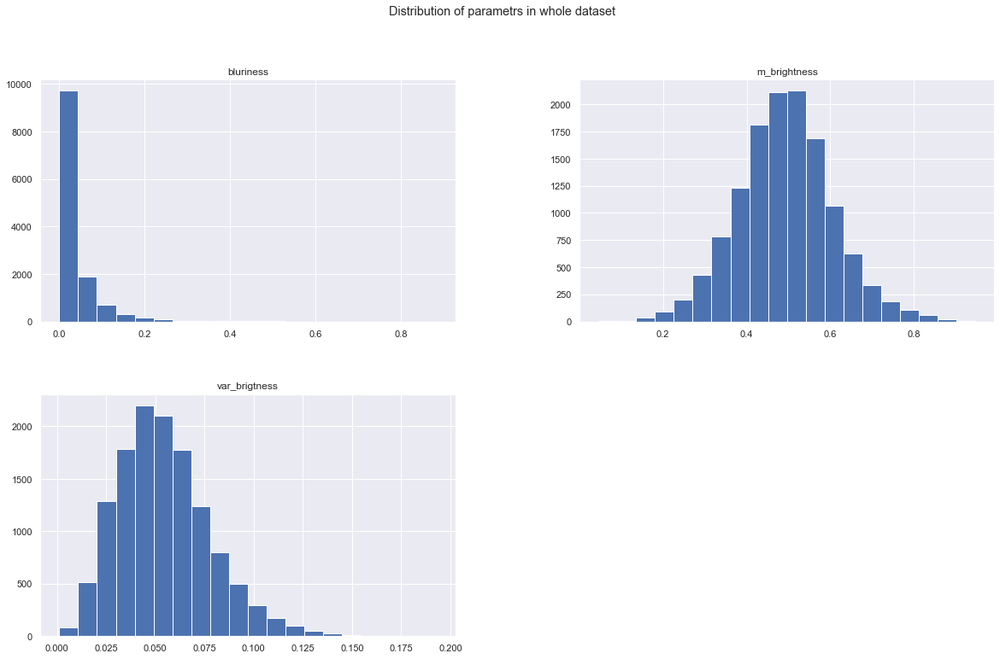

In [23]:
full_d_info[['bluriness', 'm_brightness', 'var_brigtness']].hist(bins=20)
plt.suptitle("Distribution of parametrs in whole dataset")

## Research dependencies in dataset

We can see, that distributions of train and val datasets are the same.<br>
Then other properties of our dataset can be found. 

In [24]:
def plot_scatter_hw(sizes):
    color_labels = sizes['noisy_labels_0'].unique()
    rgb_vals = sns.color_palette("Set2", 10)
    color_map = dict(zip(color_labels, rgb_vals))
    
    plt.figure(figsize=(20, 10))
    plt.xlabel('width')
    plt.ylabel('height')

    s = [20*n for n in sizes['count']]
    plt.scatter(x=sizes['width'], y=sizes['height'], c=sizes['noisy_labels_0'].map(color_map), s=s)

    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in color_map.items()]
    plt.legend(title='label', handles=handles)

In [25]:
sizes = full_d_info.groupby(['height', 'width', 'noisy_labels_0']).size().reset_index().rename(columns={0:'count'})

In [26]:
len(sizes.width.unique()), len(sizes.height.unique()), len(sizes)

(685, 754, 4719)

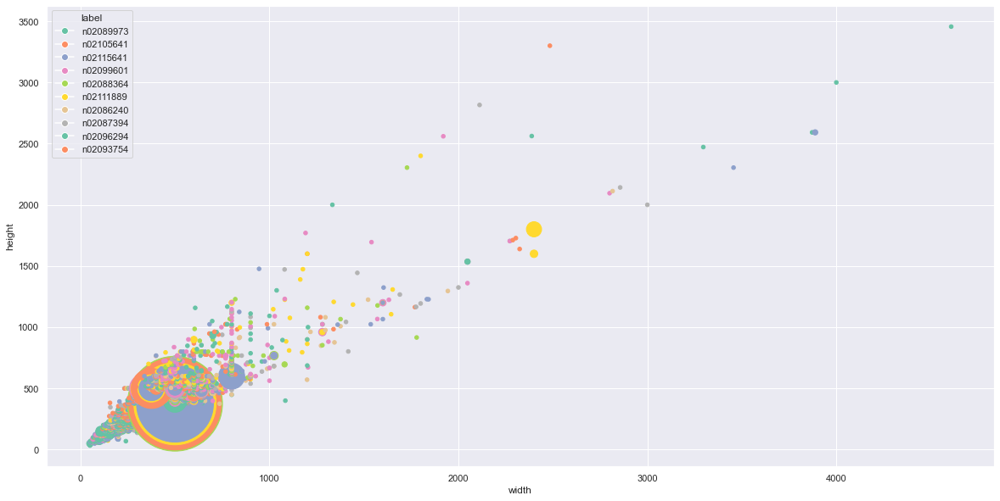

In [27]:
plot_scatter_hw(sizes)

### Most frequent size in dataset

The fact can be noticed, that majority of examples in dataset has certain size. And also, distribution of this image can differ from general distribution

In [28]:
height_mode, width_mode, _, _ = sizes.iloc[sizes['count'].idxmax()]

In [29]:
height_mode, width_mode

(375, 500)

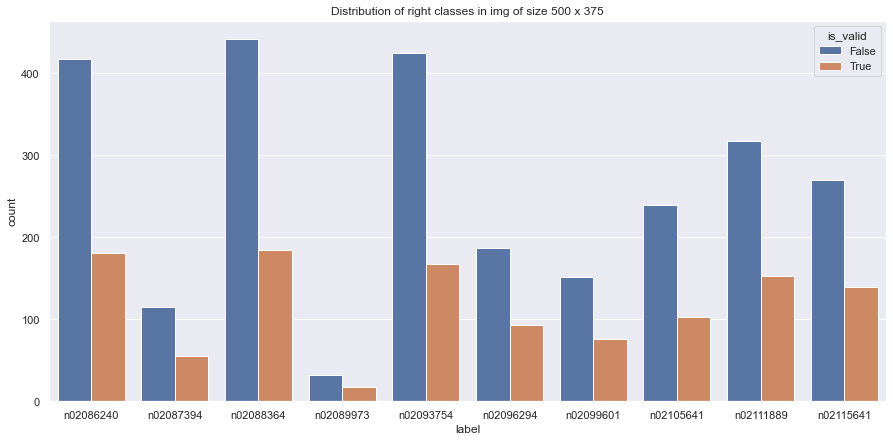

In [30]:
most_freq_size_dataset = full_d_info[(full_d_info['height'] == height_mode) & (full_d_info['width'] == width_mode)]
classes_count_valid_train = get_count(most_freq_size_dataset, 'noisy_labels_0')
plot_train_val_distr(classes_count_valid_train, title=f'Distribution of right classes in img of size {width_mode} x {height_mode}')

d:\Projects\ImageWoofCls\venv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


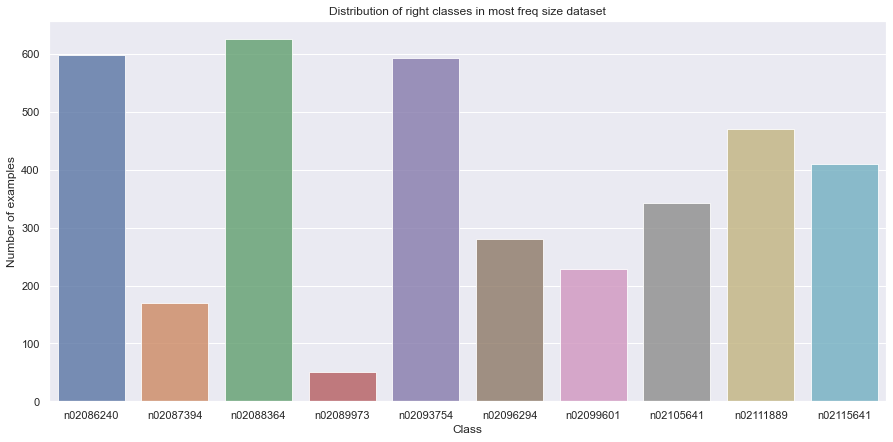

In [31]:
classes_count_freq_size = most_freq_size_dataset['noisy_labels_0'].value_counts().sort_index()
plot_class_distr(classes_count_freq_size.index, classes_count_freq_size.values, title="Distribution of right classes in most freq size dataset")

Text(0.5, 0.98, 'Distribution of parametrs in most freauent resolution images')

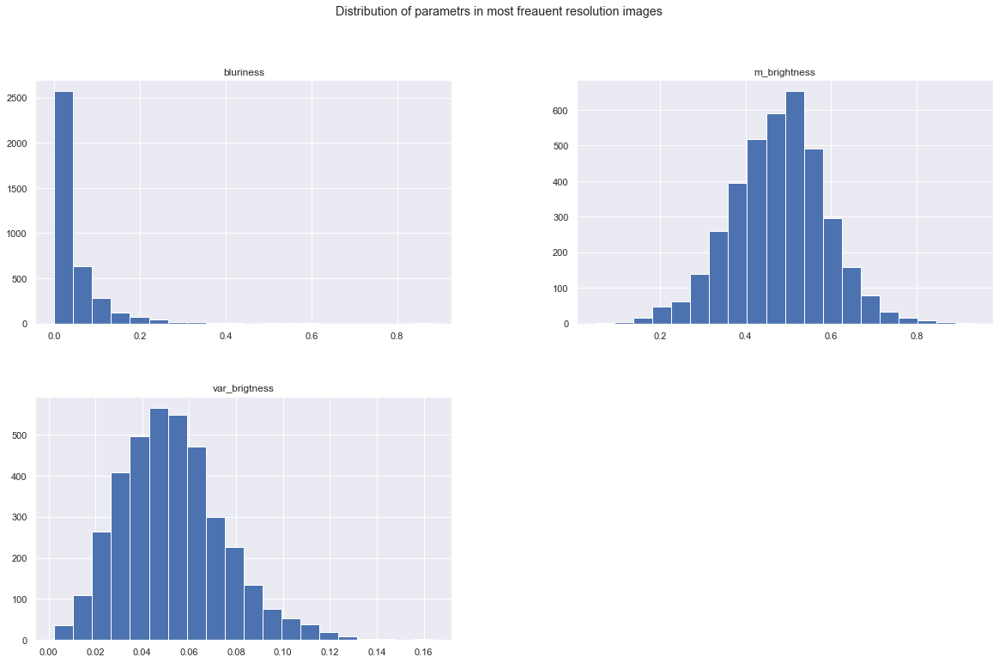

In [32]:
most_freq_size_dataset[['bluriness', 'm_brightness', 'var_brigtness']].hist(bins=20)
plt.suptitle("Distribution of parametrs in most freauent resolution images")

Let's compare our observed distribution with expected from general population using chi square.

In [36]:
#rescale observed frequincise to compare distribution
expected_distr = classes_count.to_numpy()
observed_distr = classes_count_freq_size.to_numpy()


expected_distr = expected_distr * (np.sum(observed_distr)/np.sum(expected_distr))

assert int(np.sum(expected_distr)) == int(np.sum(observed_distr))
chisquare(f_obs=observed_distr, f_exp=expected_distr)

Power_divergenceResult(statistic=743.1270205207921, pvalue=3.6778024579355194e-154)

So, we see, that difference is statistically signficant.

### Low resolution dataset

The most frequent size is (500 x 375). It's mode of our dataset. Let's plot distribution of low and high resolution images splitted by width mode.

In [37]:
# print the lowest resolution image paramets
full_d_info.loc[full_d_info['height'].idxmin()]

noisy_labels_0     n02089973
noisy_labels_1     n02089973
noisy_labels_5     n02089973
noisy_labels_25    n02089973
noisy_labels_50    n02089973
is_valid               False
height                    33
width                     50
ch                         3
area                    1650
bluriness           0.045202
m_brightness        0.426991
var_brigtness       0.028501
Name: train/n02089973/n02089973_755.JPEG, dtype: object

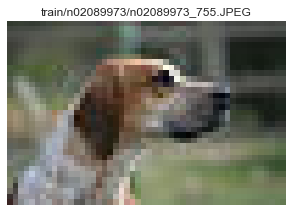

In [38]:
plot_img(full_d_info['height'].idxmin())

In [39]:
# print number of low resolution images
len(full_d_info[full_d_info['width'] < width_mode])

4437

In [40]:
# print number of high resolution images
len(full_d_info[full_d_info['width'] > width_mode])

1202

In [41]:
len(full_d_info[full_d_info['width'] == width_mode])

7315

Text(0.5, 0.98, 'Distribution of low resolution images')

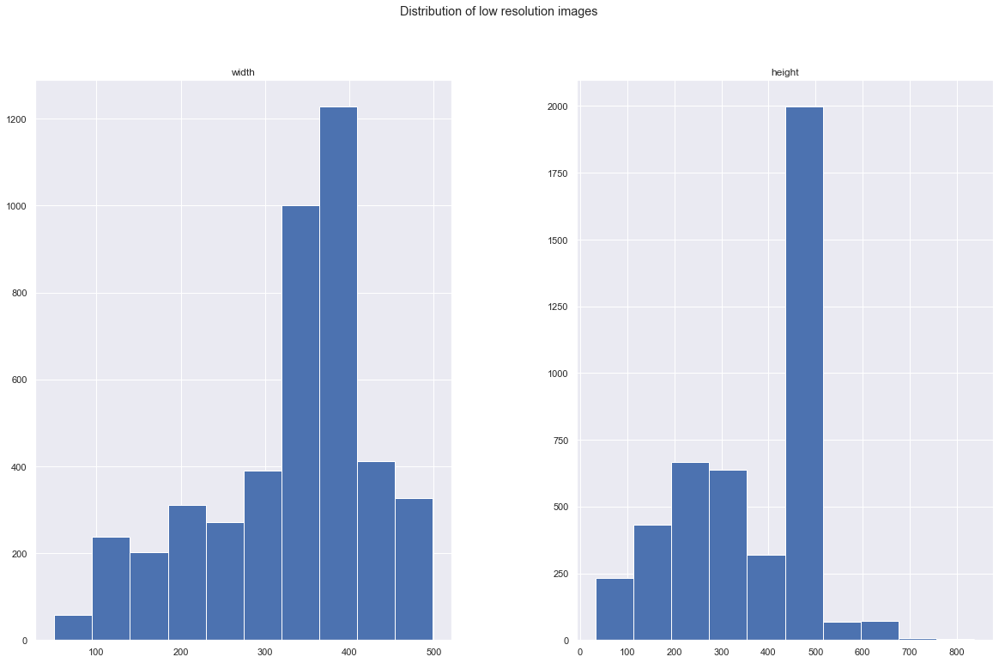

In [42]:
full_d_info[full_d_info['width'] < width_mode][['width', 'height']].hist()
plt.suptitle("Distribution of low resolution images")

d:\Projects\ImageWoofCls\venv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


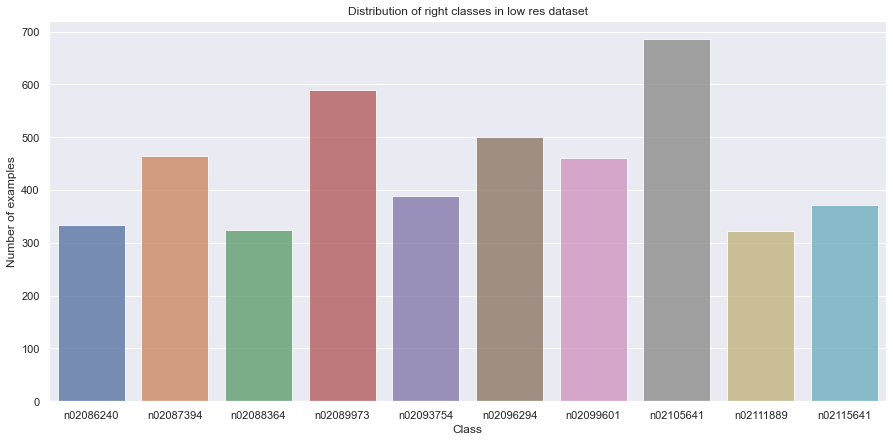

In [43]:
classes_count_low_size = full_d_info[full_d_info['width'] < width_mode]['noisy_labels_0'].value_counts().sort_index()
plot_class_distr(classes_count_low_size.index, classes_count_low_size.values, title="Distribution of right classes in low res dataset")

Text(0.5, 0.98, 'Distribution of parametrs in low resolution images')

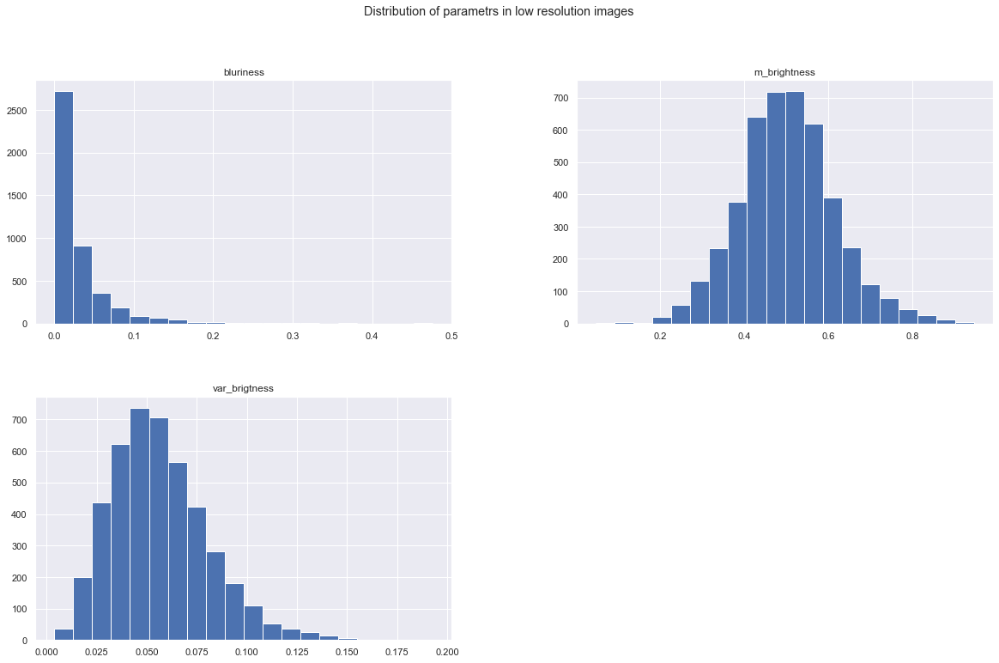

In [44]:
full_d_info[full_d_info['width'] < width_mode][['bluriness', 'm_brightness', 'var_brigtness']].hist(bins=20)
plt.suptitle("Distribution of parametrs in low resolution images")

### High resolution dataset

In [45]:
# print the highes resolution image parametrs
full_d_info.loc[full_d_info['height'].idxmax()]

noisy_labels_0     n02089973
noisy_labels_1     n02089973
noisy_labels_5     n02089973
noisy_labels_25    n02096294
noisy_labels_50    n02089973
is_valid               False
height                  3456
width                   4608
ch                         3
area                15925248
bluriness           0.000767
m_brightness        0.442286
var_brigtness       0.050953
Name: train/n02089973/n02089973_5084.JPEG, dtype: object

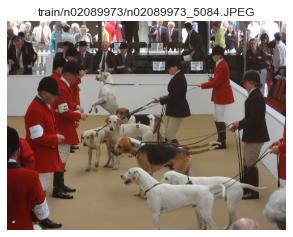

In [46]:
plot_img(full_d_info['height'].idxmax())

Text(0.5, 0.98, 'Distribution of hight resolution images')

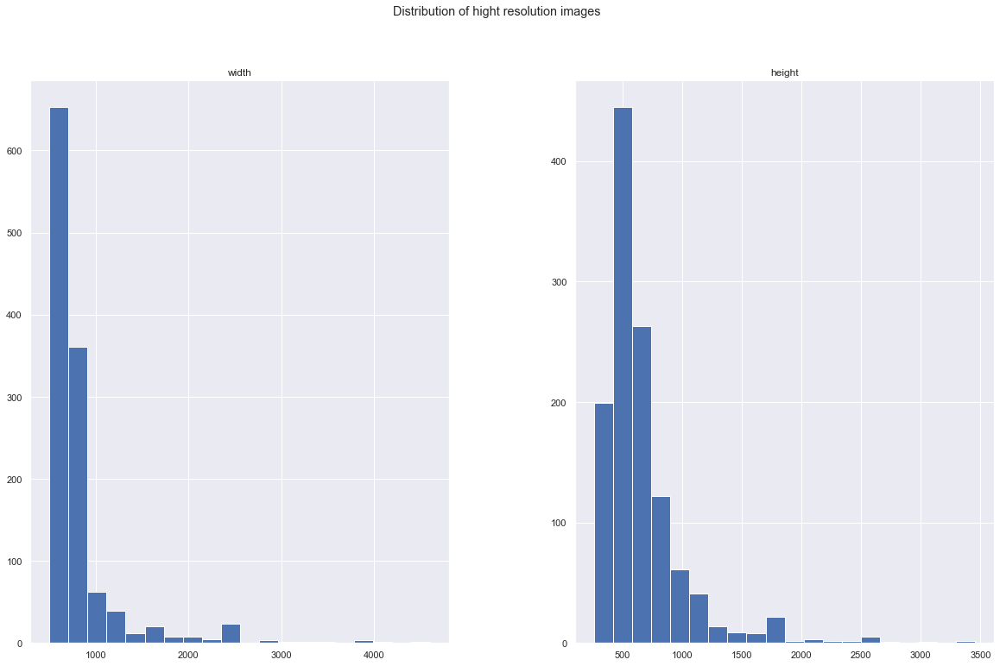

In [47]:
full_d_info[full_d_info['width'] > width_mode][['width', 'height']].hist(bins=20)
plt.suptitle("Distribution of hight resolution images")

d:\Projects\ImageWoofCls\venv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


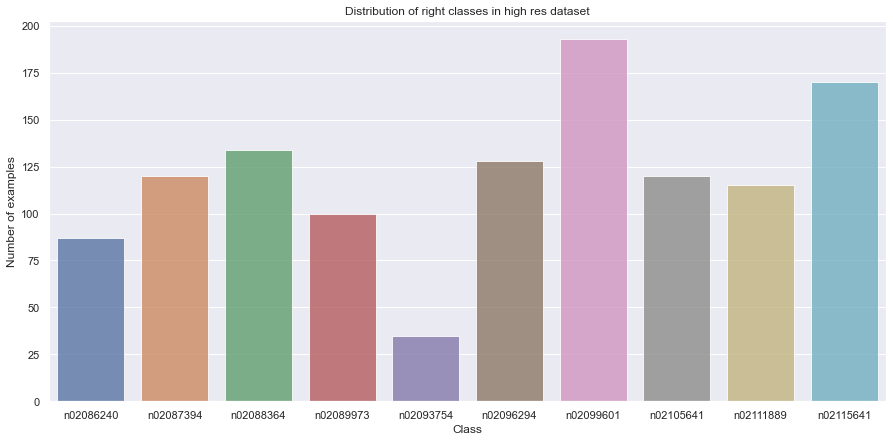

In [48]:
classes_count_high_size = full_d_info[full_d_info['width'] > width_mode]['noisy_labels_0'].value_counts().sort_index()
plot_class_distr(classes_count_high_size.index, classes_count_high_size.values, title="Distribution of right classes in high res dataset")

Text(0.5, 0.98, 'Distribution of parametrs in low resolution images')

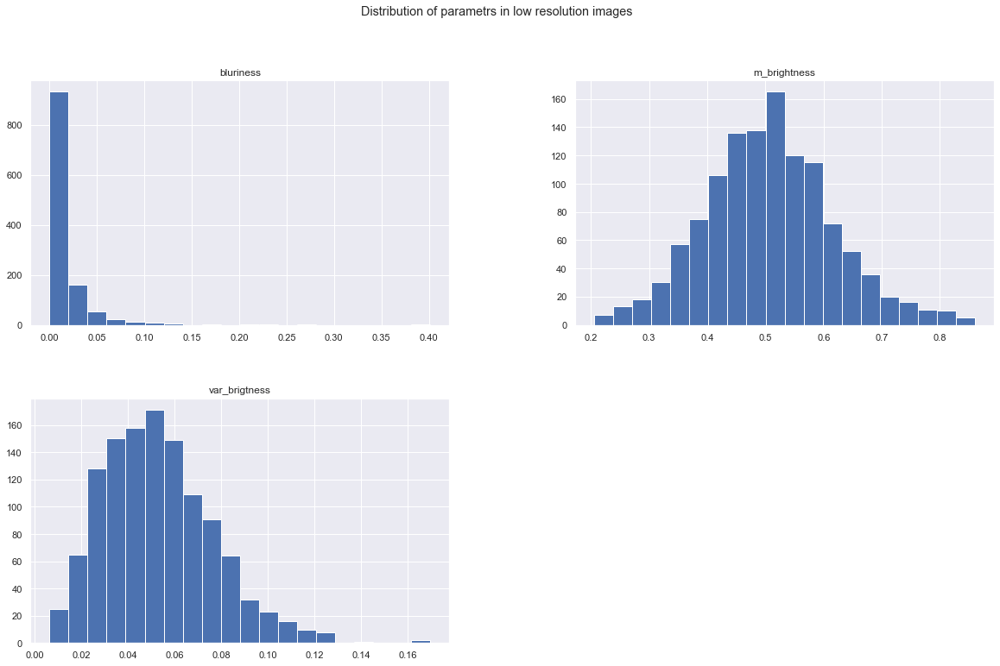

In [49]:
full_d_info[full_d_info['width'] > width_mode][['bluriness', 'm_brightness', 'var_brigtness']].hist(bins=20)
plt.suptitle("Distribution of parametrs in low resolution images")

Interesting fact can be noticed. Dataset of images with label n02089973, which has less frequency in whole dataset, has the second most frequent number of occurence in low resolution dataset.

## Distribution of paremtes according to it class

Text(0.5, 0.98, 'Distribution of bluriness in different classes')

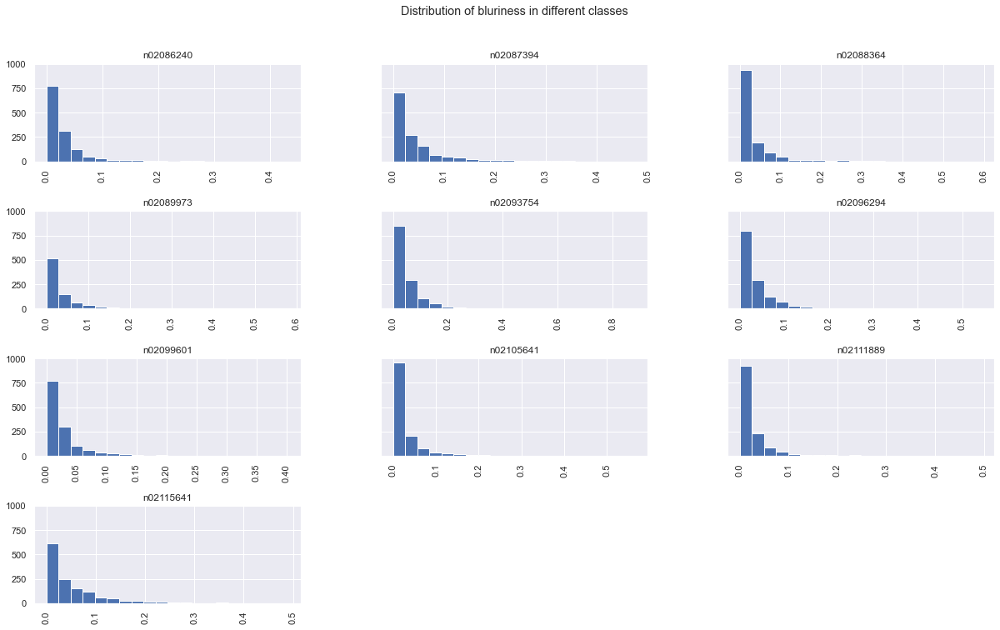

In [50]:
full_d_info[['bluriness', 'noisy_labels_0']].hist(bins=20, by='noisy_labels_0',  sharey=True)
plt.suptitle("Distribution of bluriness in different classes")

Dsitribution of bluriness hard to see for big values of bluriness.
Let's visualise it using log scale.

Text(0.5, 0.98, 'Distribution of bluriness in different classes using log scale')

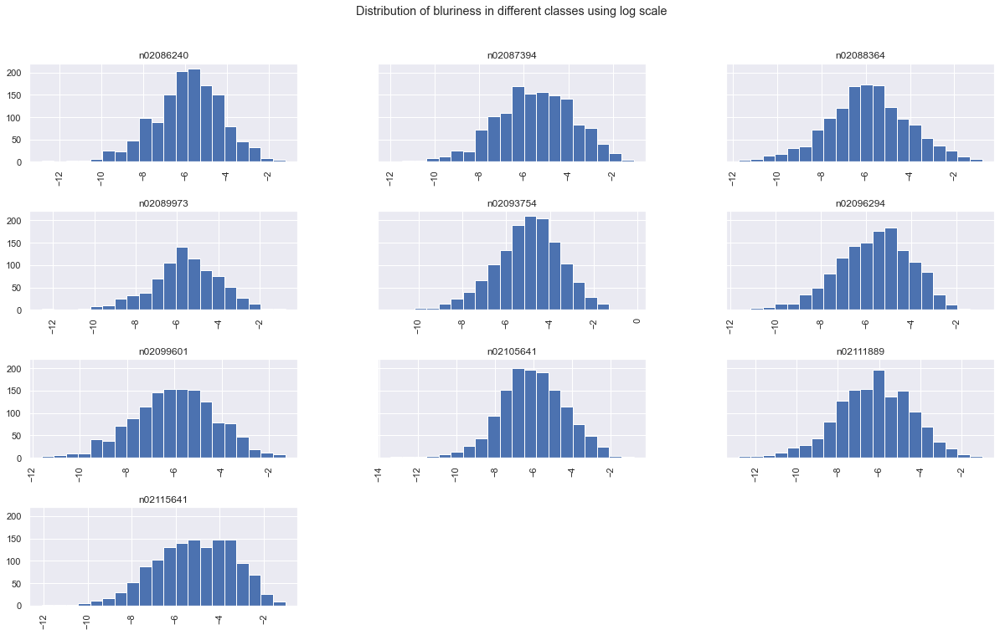

In [51]:
log_df = full_d_info[['bluriness', 'noisy_labels_0']].copy()
log_df['bluriness'] = np.log2(log_df['bluriness'])
full_d_info['log_bluriness'] = log_df['bluriness']
log_df[['bluriness', 'noisy_labels_0']].hist(bins=20, by='noisy_labels_0',  sharey=True)
plt.suptitle("Distribution of bluriness in different classes using log scale")

Text(0.5, 0.98, 'Distribution of brightness in different classes')

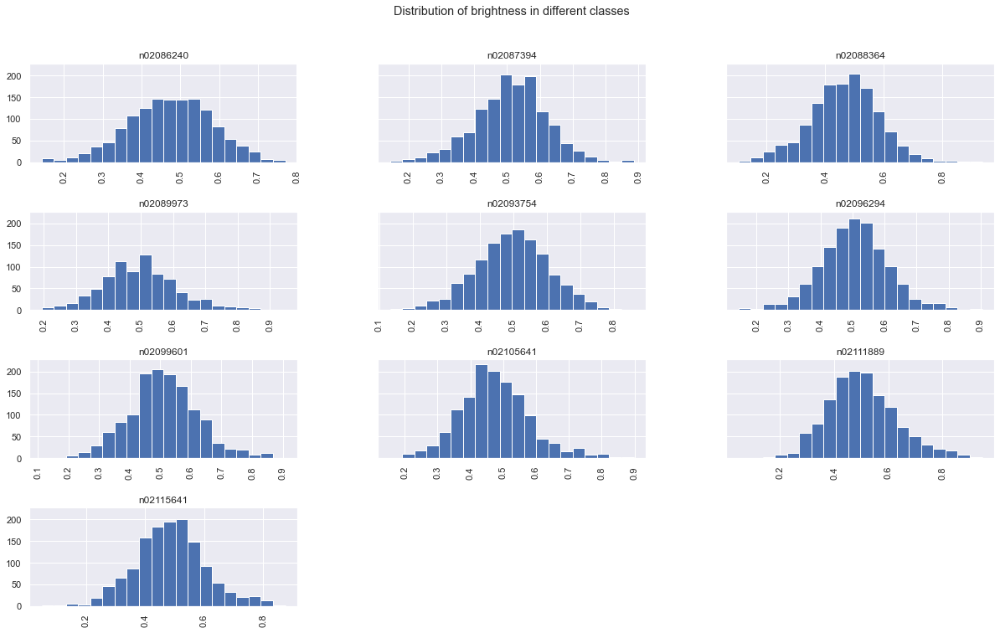

In [52]:
full_d_info[['m_brightness', 'noisy_labels_0']].hist(bins=20, by='noisy_labels_0',  sharey=True)
plt.suptitle("Distribution of brightness in different classes")

Text(0.5, 0.98, 'Distribution of brightness variance in different classes')

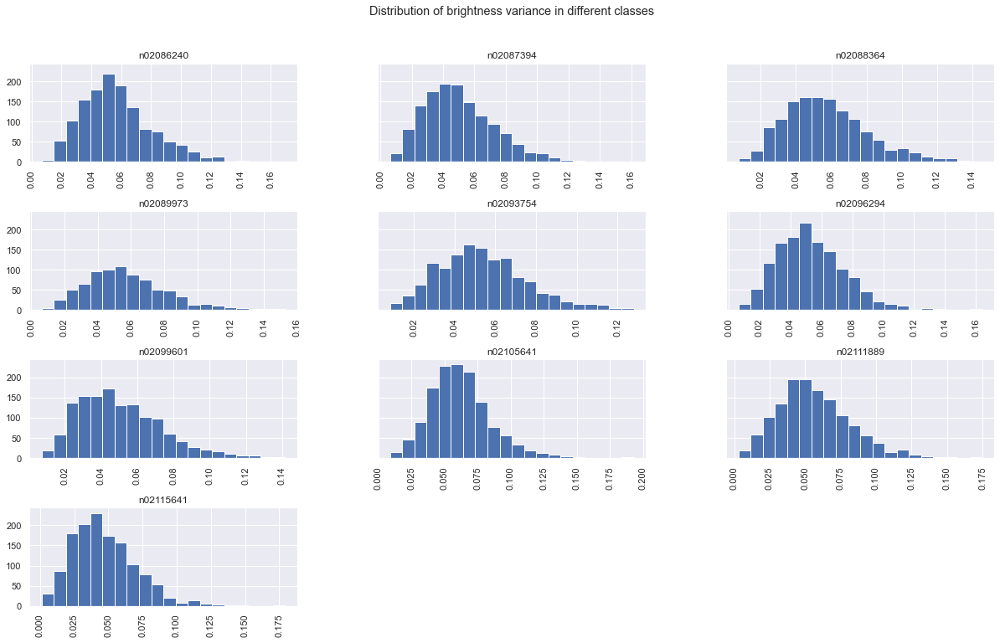

In [53]:
full_d_info[['var_brigtness', 'noisy_labels_0']].hist(bins=20, by='noisy_labels_0',  sharey=True)
plt.suptitle("Distribution of brightness variance in different classes")

So, uniform distribution can be seen for all parametrs among all classes. And these distributions similar to each other.

## Plot boxplots for different parametrs

<AxesSubplot:xlabel='noisy_labels_0', ylabel='bluriness'>

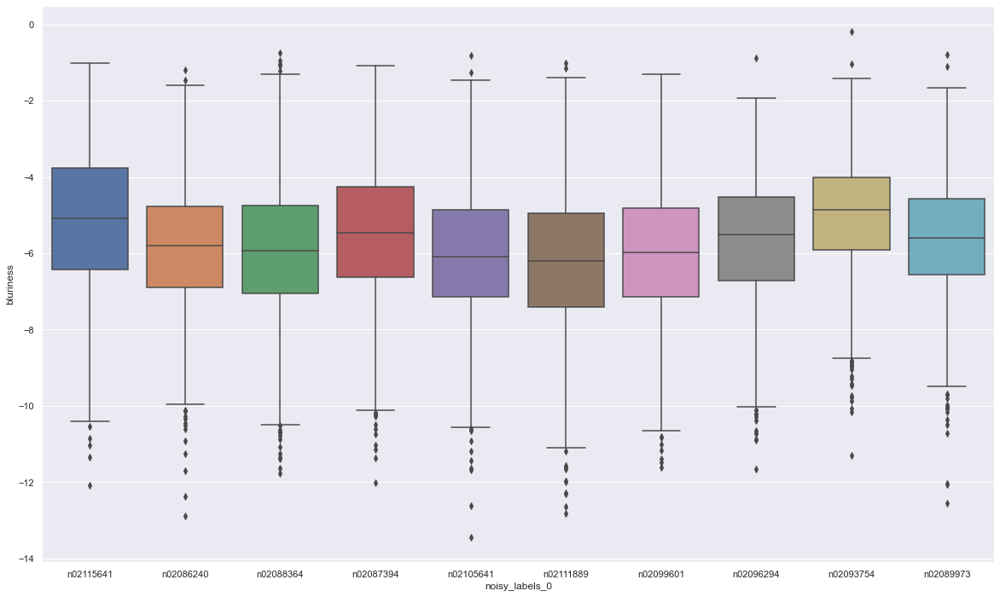

In [54]:
sns.boxplot(y='bluriness', x='noisy_labels_0', data=log_df)

<AxesSubplot:xlabel='noisy_labels_0', ylabel='m_brightness'>

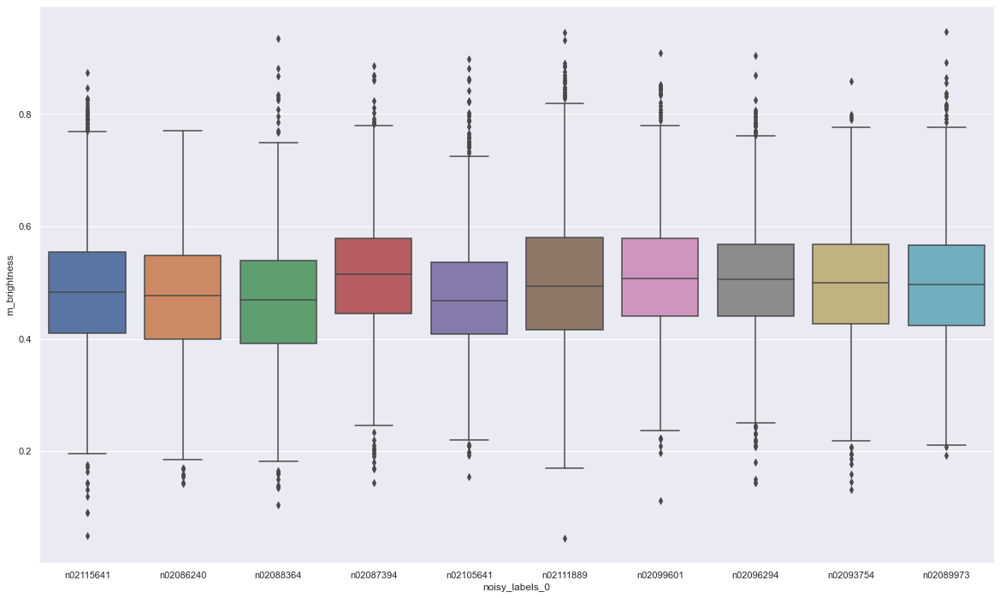

In [55]:
sns.boxplot(y='m_brightness', x='noisy_labels_0', data=full_d_info)

<AxesSubplot:xlabel='noisy_labels_0', ylabel='width'>

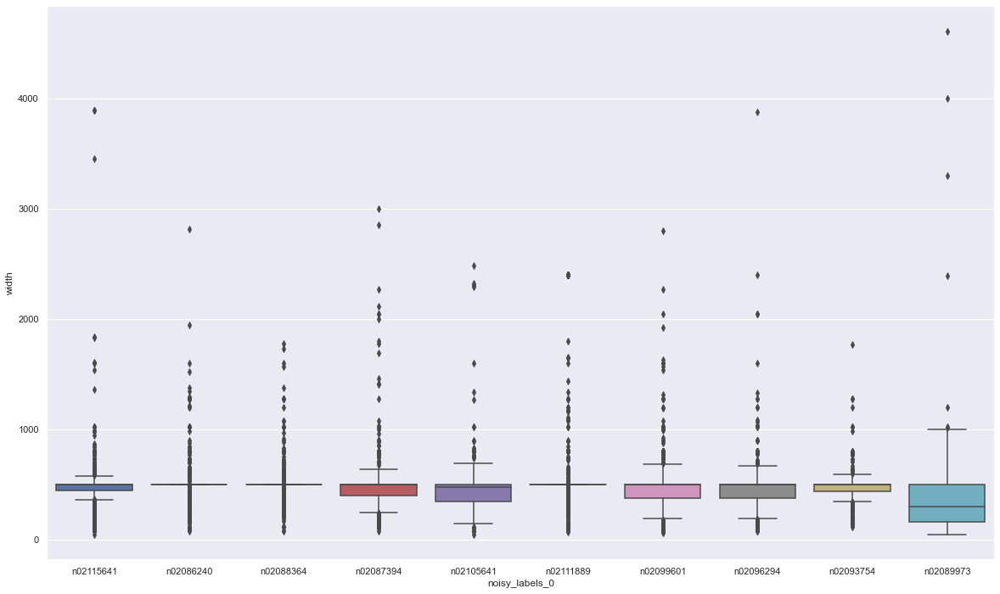

In [56]:
sns.boxplot(y='width', x='noisy_labels_0', data=full_d_info)

Our assumption about simmilarities of distributions get another proof. But distributions of image width for each class look different. For some classes there is big range of image sizes, but for some of them we can see a really good box plot with small amount of anomalies. The reason of this effect can be the fact, that some classes have majority of low resolution images(n02089973), while other classes have a lot examples of high resolution images. And due to fact, that around 50% of images have certain resolution (500 x 375), it can give us that picture.

## Plot images of different classes

In [57]:
def plot_imgs(imgs, icls):
    fig, ax = plt.subplots()
    fig.set_size_inches((12,4))
    ax.set_axis_off()
    fig.suptitle(f"Class {icls}")

    for i, img_f in enumerate(imgs.iterrows()):
        a = fig.add_subplot(1, 3, i + 1)
        img = cv.cvtColor(cv.imread(os.path.join(path_to_imgs, img_f[0])), cv.COLOR_BGR2RGB)
        h0, w0 = img.shape[:2]
        scale_w, scale_h = 500/w0, 375/h0
        h, w = int(round(h0 * scale_h)), int(round(w0 * scale_w))

        img = cv.resize(img, (h, w), interpolation=cv.INTER_AREA)

        plt.title(f"Size {int(img_f[1]['width'])}x{int(img_f[1]['height'])}")
        plt.axis('off')
        plt.imshow(img)

In [58]:
def get_random_imgs(imgs, n, icls):
    return imgs[imgs['noisy_labels_0'] == icls].sample(n=n, random_state=2)

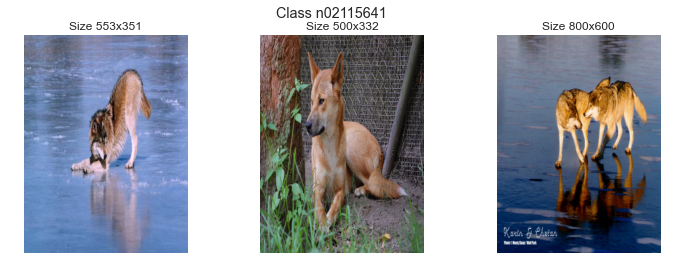

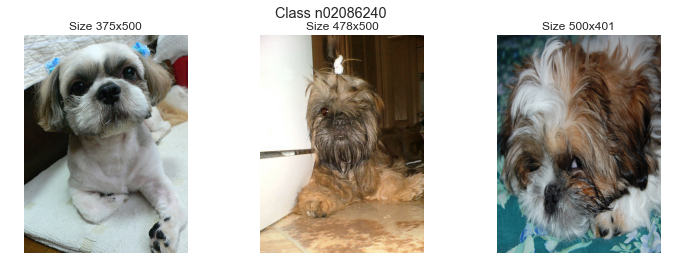

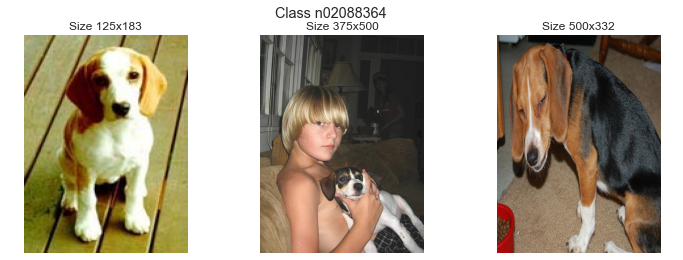

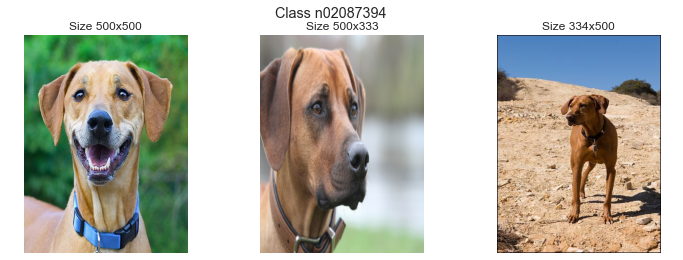

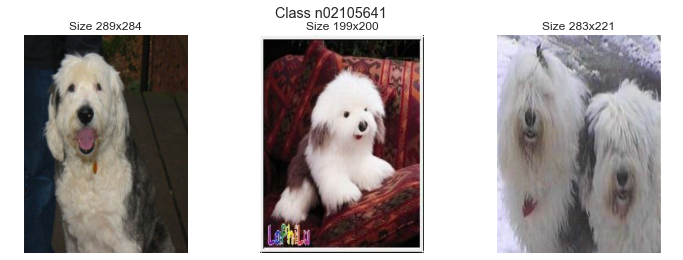

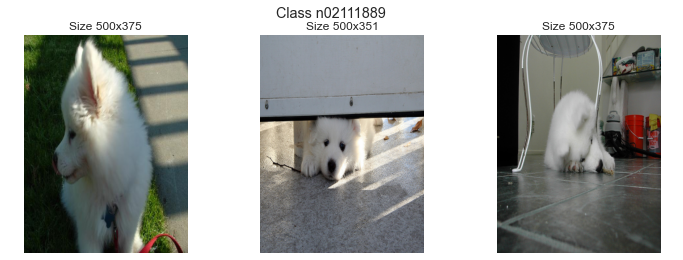

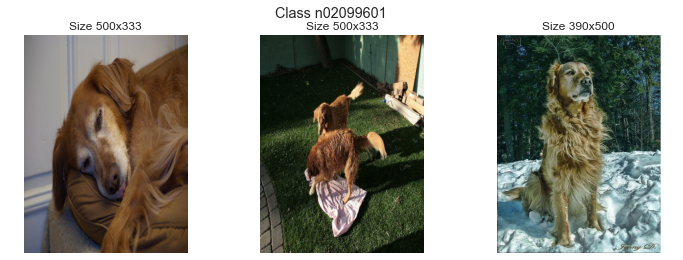

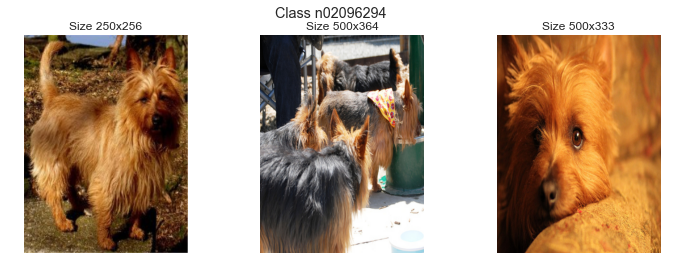

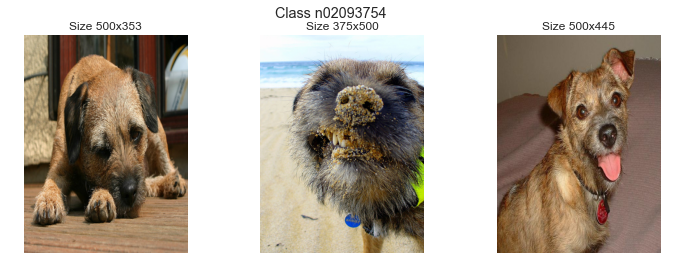

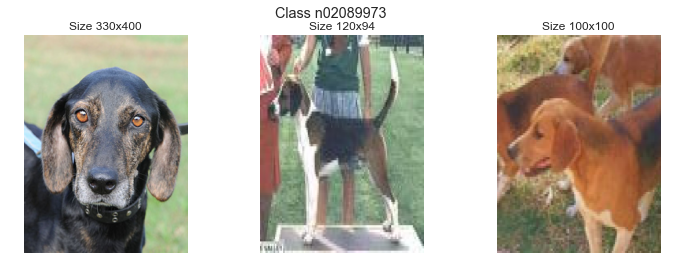

In [59]:
#plot random imgs
for icls in full_d_info['noisy_labels_0'].unique():
    plot_imgs(get_random_imgs(full_d_info, 3, icls), icls)

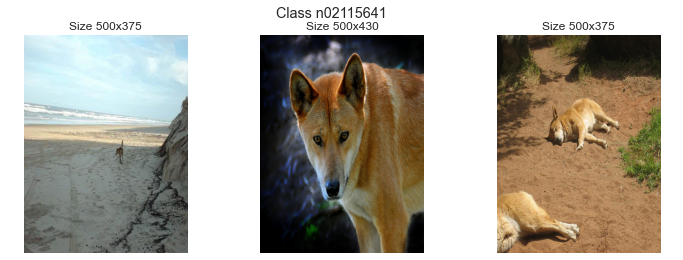

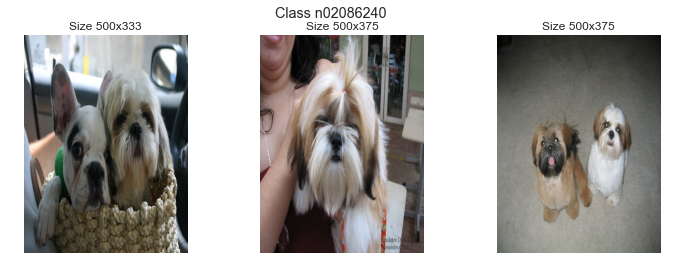

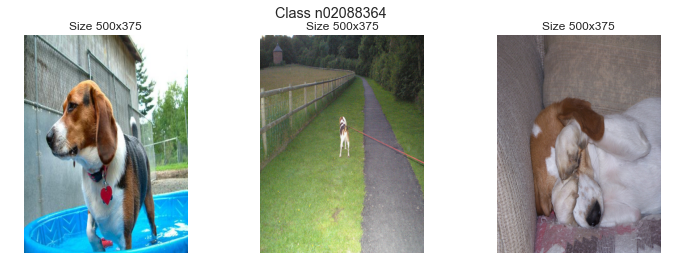

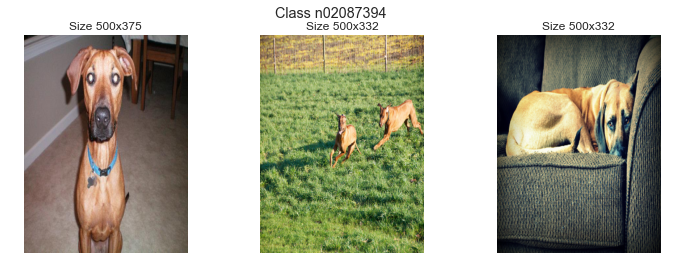

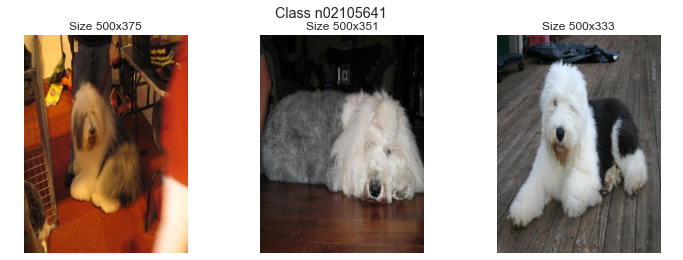

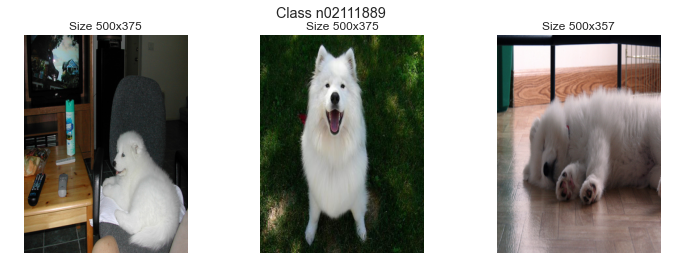

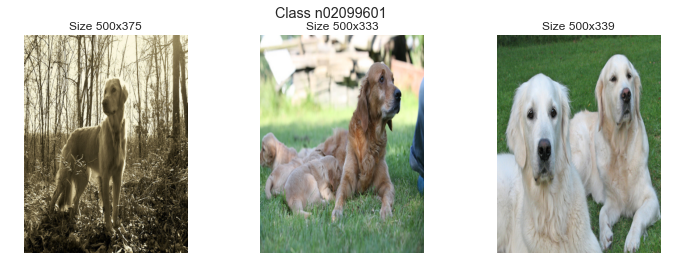

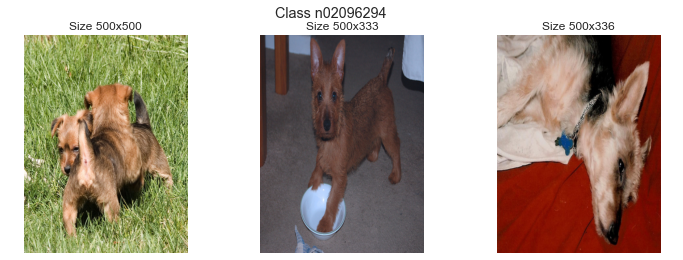

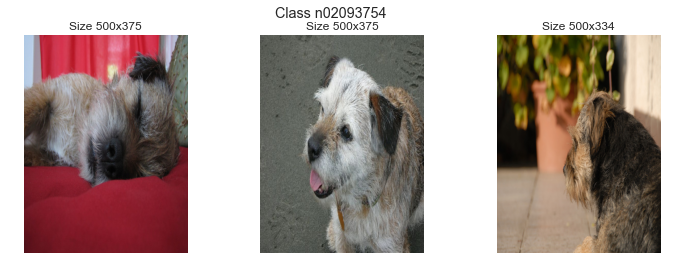

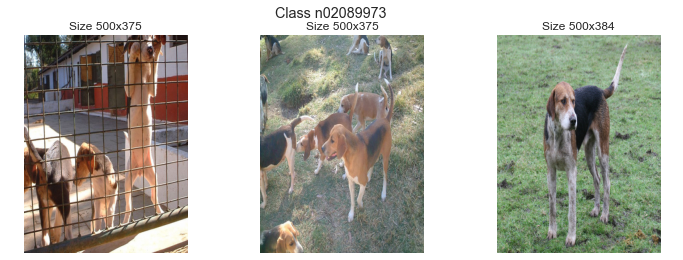

In [60]:
#plot imgs with width == 500
for icls in full_d_info['noisy_labels_0'].unique():
    plot_imgs(get_random_imgs(full_d_info[full_d_info['width'] == 500], 3, icls), icls)

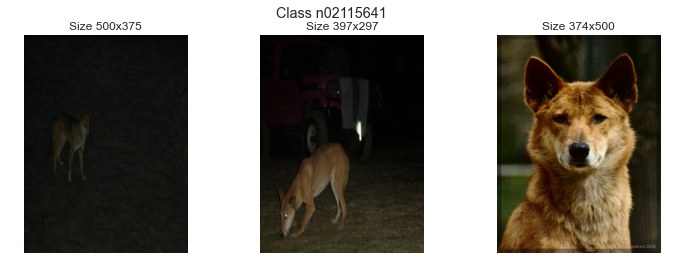

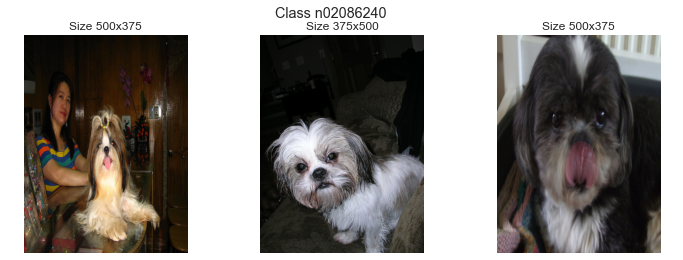

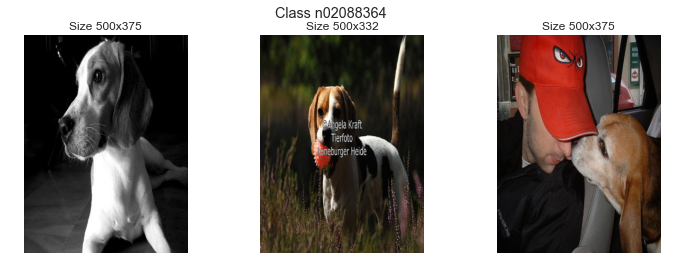

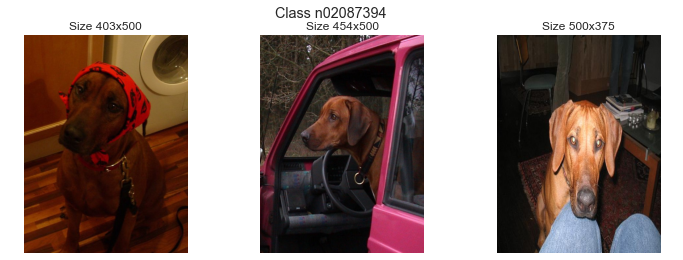

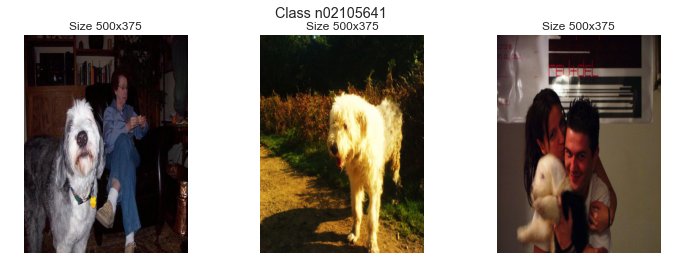

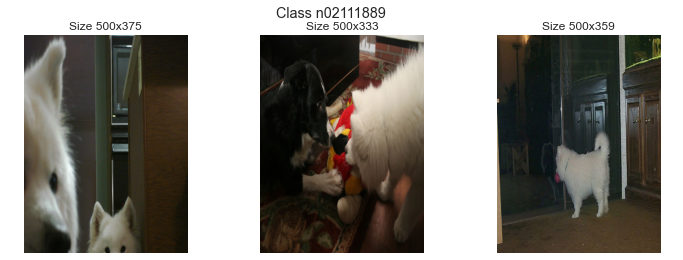

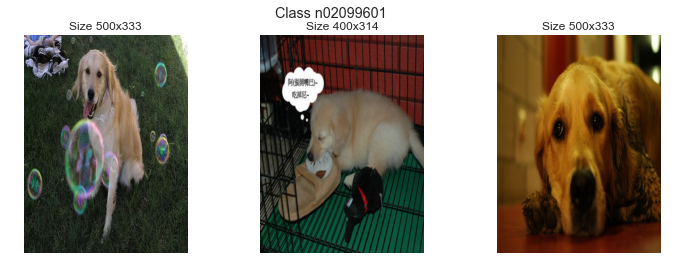

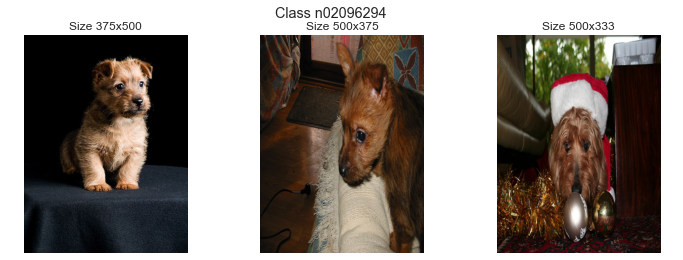

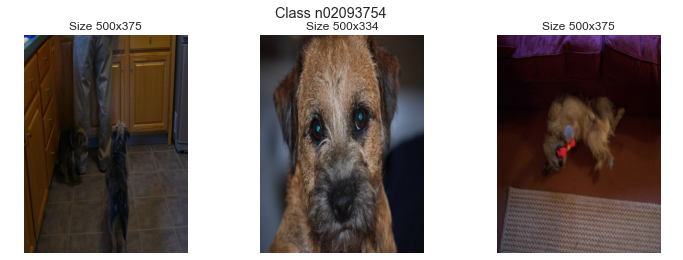

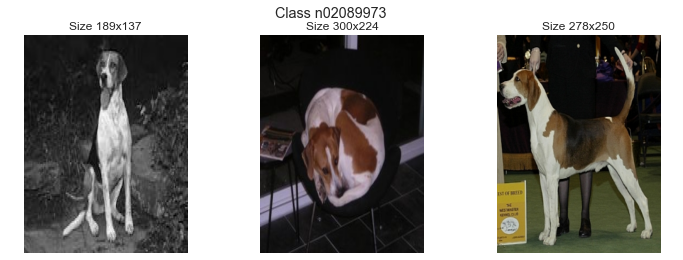

In [61]:
#plot imgs with low brightness
for icls in full_d_info['noisy_labels_0'].unique():
    plot_imgs(get_random_imgs(full_d_info[full_d_info['m_brightness'] < 0.3], 3, icls), icls)

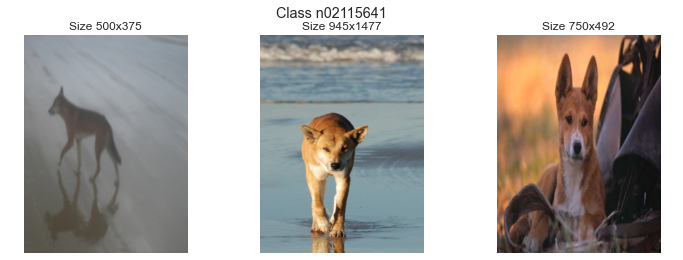

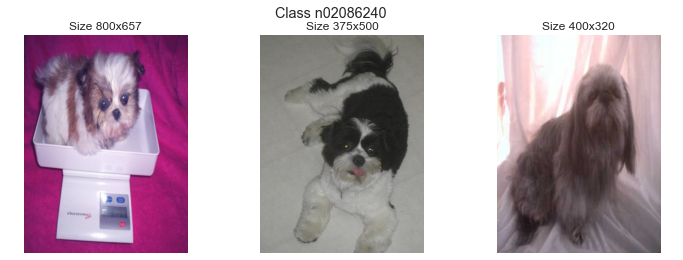

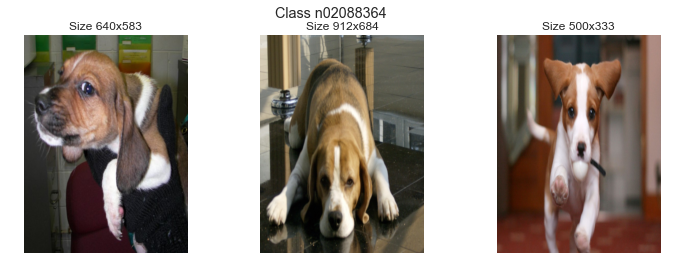

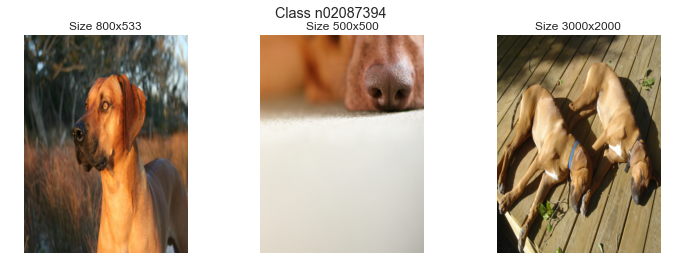

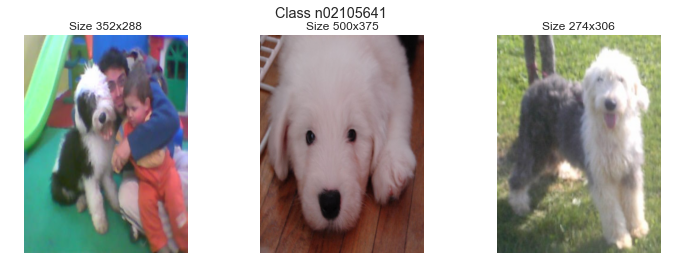

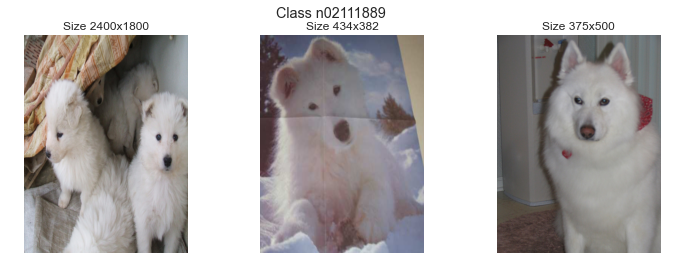

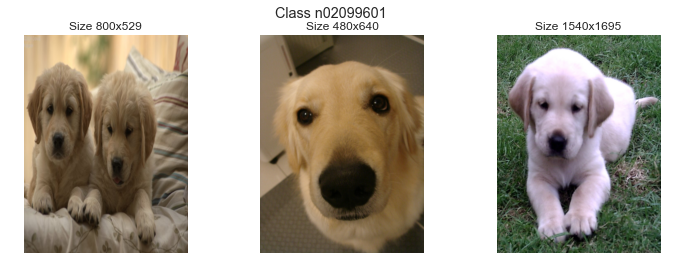

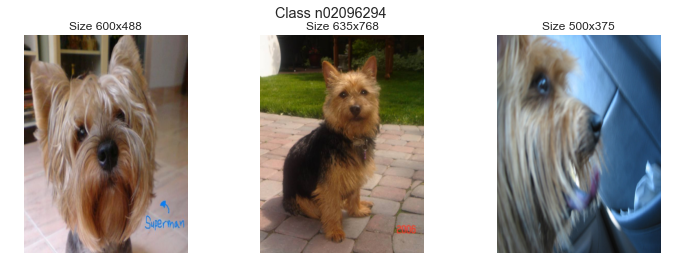

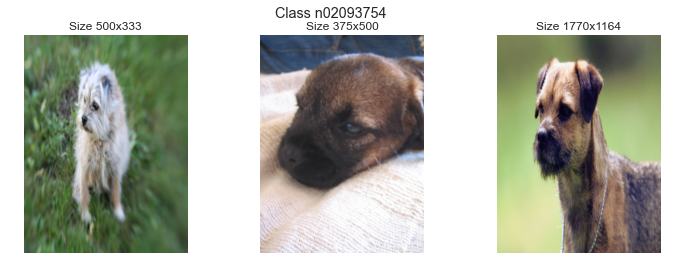

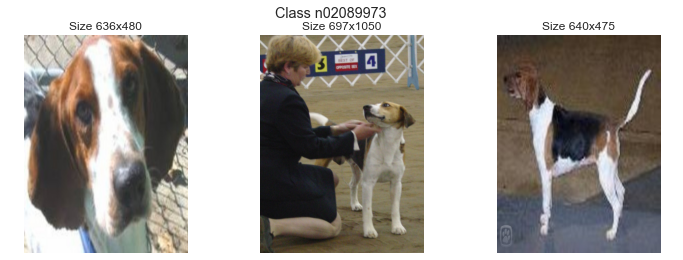

In [62]:
#plot low contrast-blurry images
for icls in full_d_info['noisy_labels_0'].unique():
    plot_imgs(get_random_imgs(full_d_info[full_d_info['log_bluriness'] < -10], 3, icls), icls)

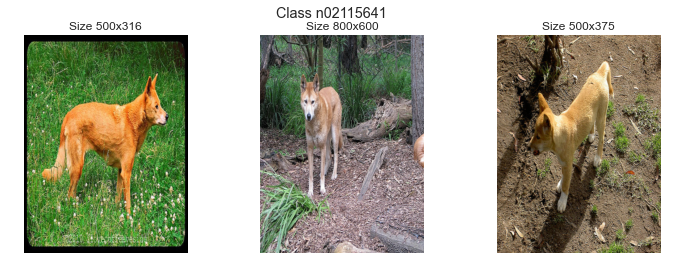

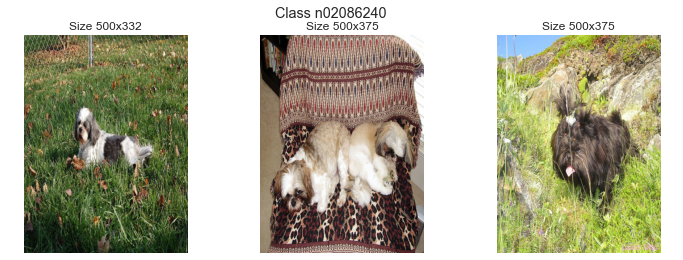

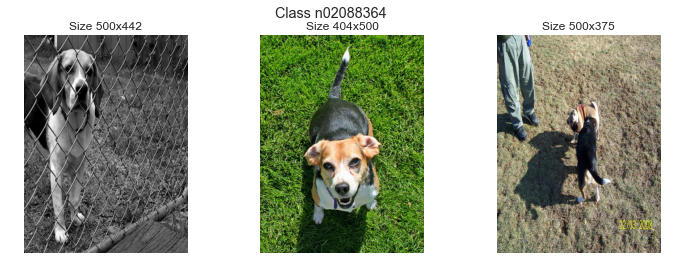

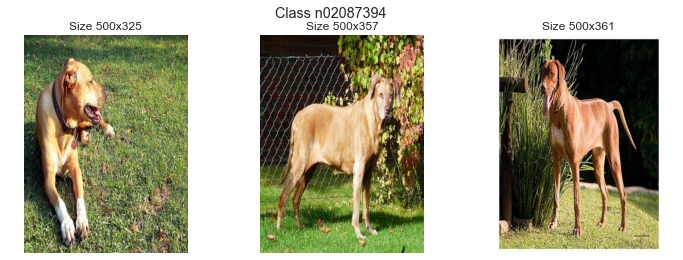

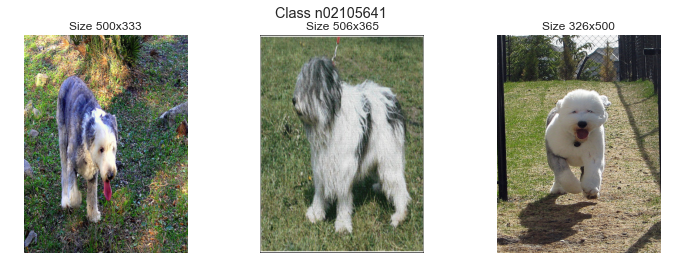

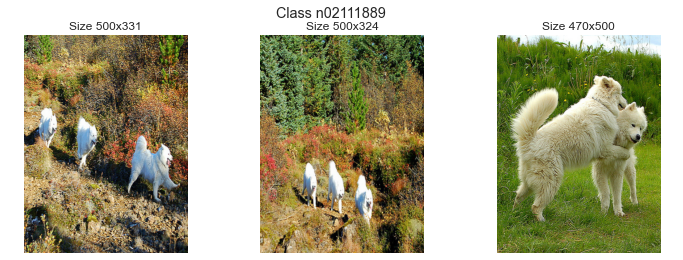

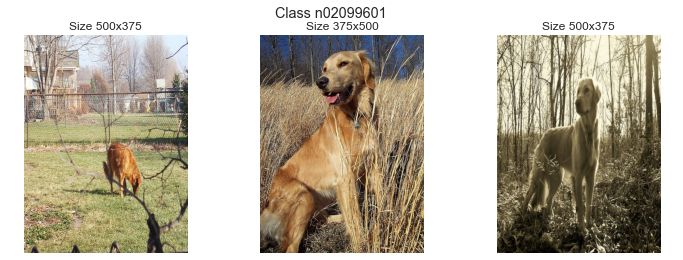

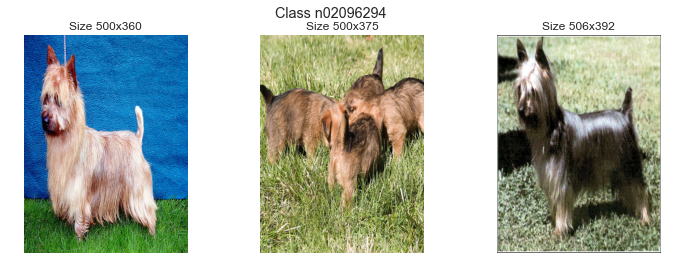

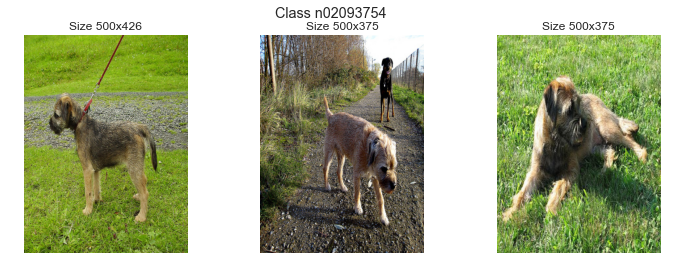

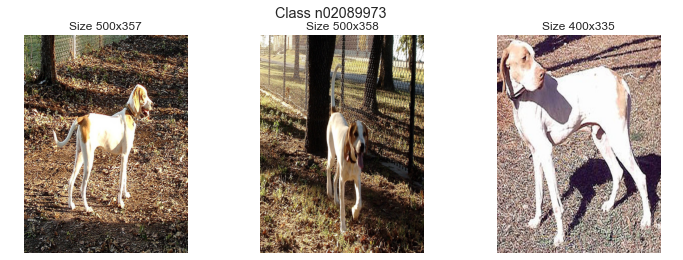

In [63]:
#plot high contrast-not blurry images
for icls in full_d_info['noisy_labels_0'].unique():
    plot_imgs(get_random_imgs(full_d_info[full_d_info['log_bluriness'] > -2], 3, icls), icls)

## Correlation of features

<AxesSubplot:>

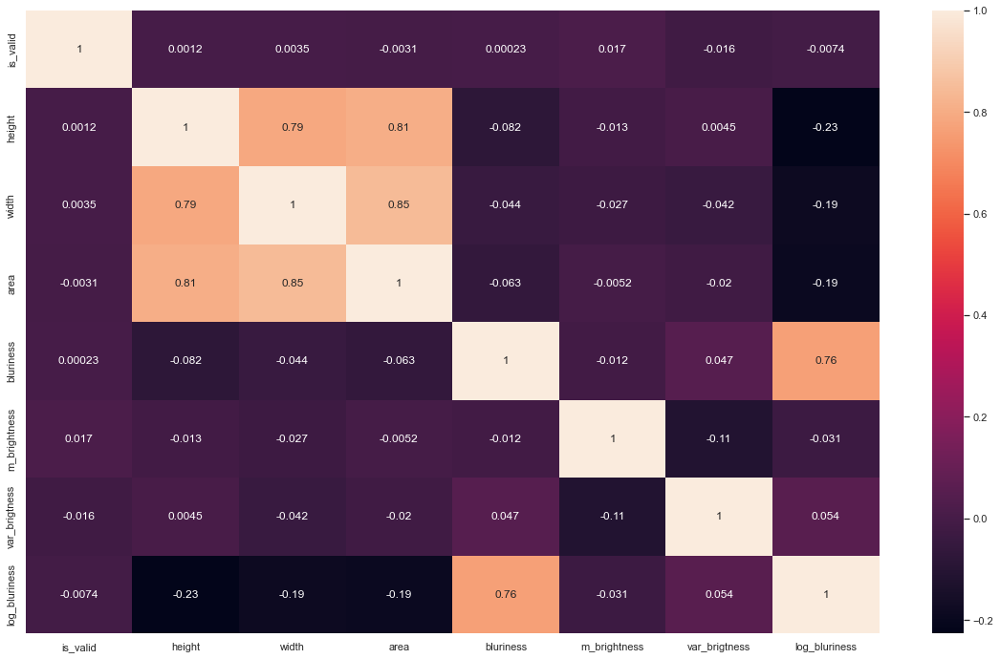

In [65]:
sns.heatmap(full_d_info.drop(columns=["ch"]).corr(), annot=True)

Bluriness has negative correlation with image size. It means, that then bigger image, the variance of laplacian(image contrast, bluriness) is lower. It can be explained the fact that the more pixels image has, than variance of laplacian is lower.